<a href="https://colab.research.google.com/github/kskksg4/Cat_hipsterizer/blob/master/Cat_hipsterizer_training_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [2]:
import keras, sys, cv2, os
import numpy as np
import pandas as pd

from keras.models import Model, load_model
from math import atan2, degrees
from google.colab.patches import cv2_imshow

Using TensorFlow backend.


In [3]:
img_size = 224
base_path = '/content/gdrive/My Drive/DeepLearning/Cat_hipsterizer/samples'
file_list = sorted(os.listdir(base_path))

In [4]:
glasses = cv2.imread('/content/gdrive/My Drive/DeepLearning/Cat_hipsterizer/images/glasses.png',
                     cv2.IMREAD_UNCHANGED)

In [5]:
bbs_model = load_model('/content/gdrive/My Drive/DeepLearning/Cat_hipsterizer/models/bbs_1.h5')
lmks_model = load_model('/content/gdrive/My Drive/DeepLearning/Cat_hipsterizer/models/lmks_1.h5')

In [6]:
def resize_img(im):
  old_size = im.shape[:2]  # old_size is in (height, width) format
  ratio = float(img_size) / max(old_size)
  new_size = tuple([int(x * ratio) for x in old_size])
  # new_size should be in (width, height) format
  im = cv2.resize(im, (new_size[1], new_size[0]))
  delta_w = img_size - new_size[1]
  delta_h = img_size - new_size[0]
  top, bottom = delta_h // 2, delta_h - (delta_h // 2)
  left, right = delta_w // 2, delta_w - (delta_w // 2)
  new_im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                    value=[0, 0, 0])
  # print(new_im)

  return new_im, ratio, top, left

In [7]:
# overlay function
def overlay_transparent(background_img, img_to_overlay_t, x, y, overlay_size=None):
  bg_img = background_img.copy()
  # convert 3 channels to 4 channels
  if bg_img.shape[2] == 3:
    bg_img = cv2.cvtColor(bg_img, cv2.COLOR_BGR2BGRA)

  if overlay_size is not None:
    img_to_overlay_t = cv2.resize(img_to_overlay_t.copy(), overlay_size)

  b, g, r, a = cv2.split(img_to_overlay_t)

  mask = cv2.medianBlur(a, 5)

  h, w, _ = img_to_overlay_t.shape
  roi = bg_img[int(y-h/2):int(y+h/2), int(x-w/2):int(x+w/2)]

  img1_bg = cv2.bitwise_and(roi.copy(), roi.copy(), mask=cv2.bitwise_not(mask))
  img2_fg = cv2.bitwise_and(img_to_overlay_t, img_to_overlay_t, mask=mask)

  bg_img[int(y-h/2):int(y+h/2), int(x-w/2):int(x+w/2)] = cv2.add(img1_bg, img2_fg)

  # convert 4 channels to 4 channels
  bg_img = cv2.cvtColor(bg_img, cv2.COLOR_BGRA2BGR)

  return bg_img

In [8]:
def angle_between(p1, p2):
  xDiff = p2[0] - p1[0]
  yDiff = p2[1] - p1[1]
  return degrees(atan2(yDiff, xDiff))

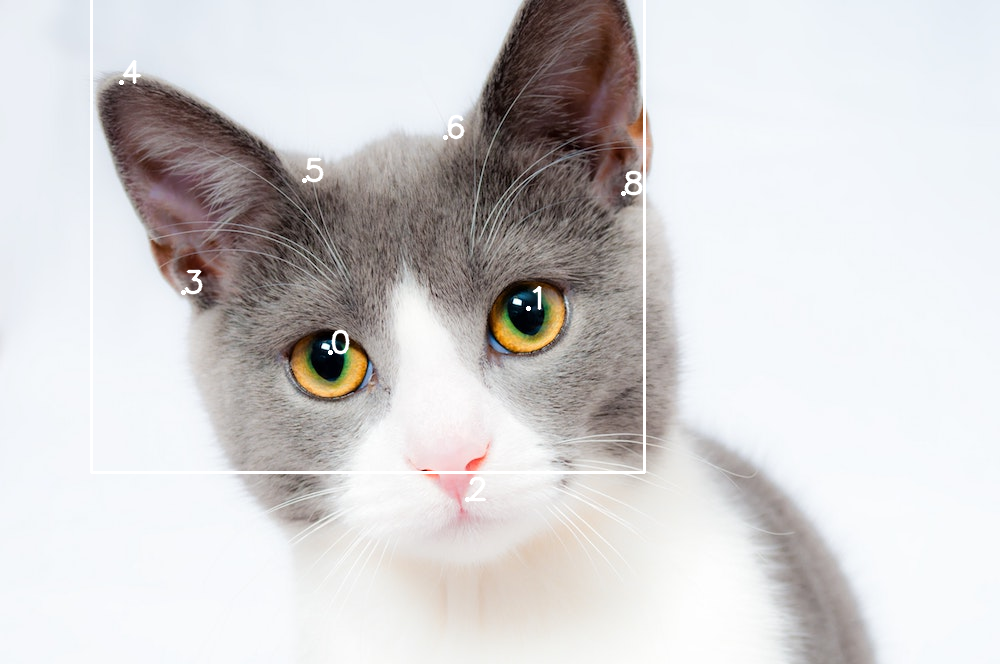

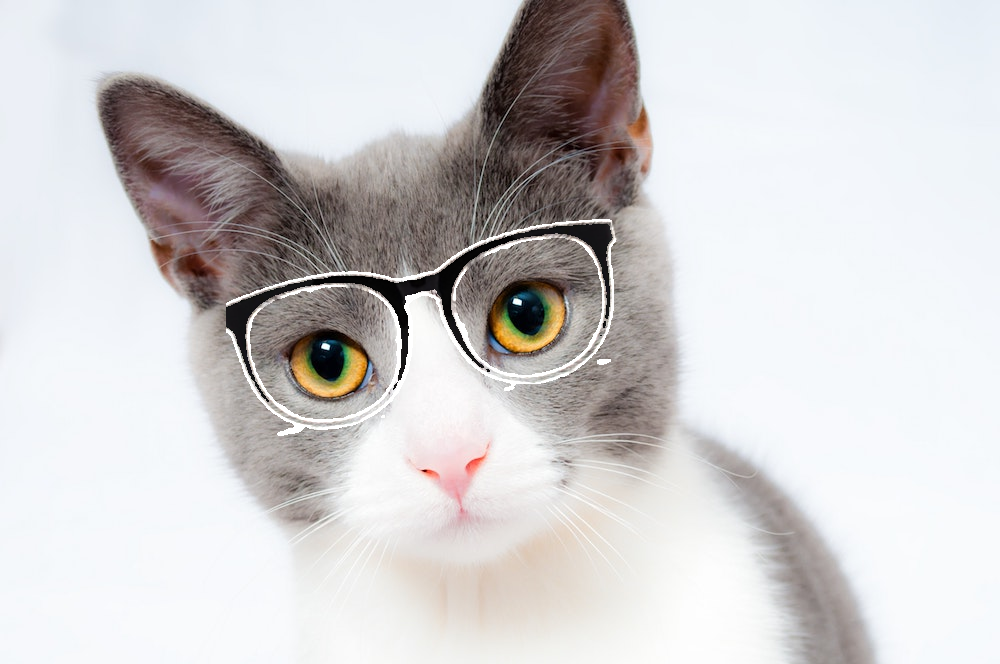

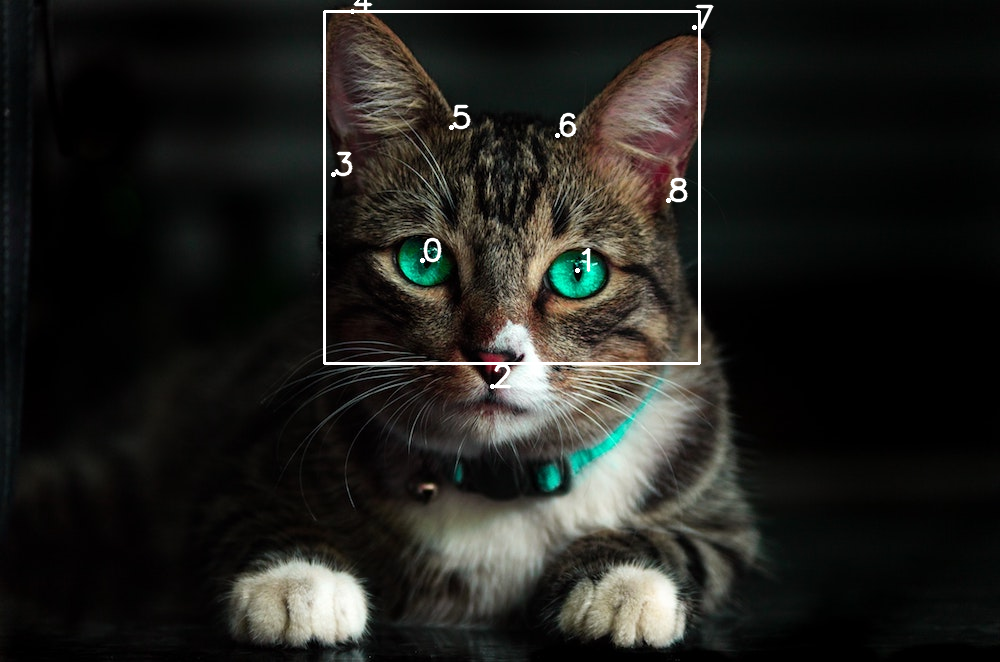

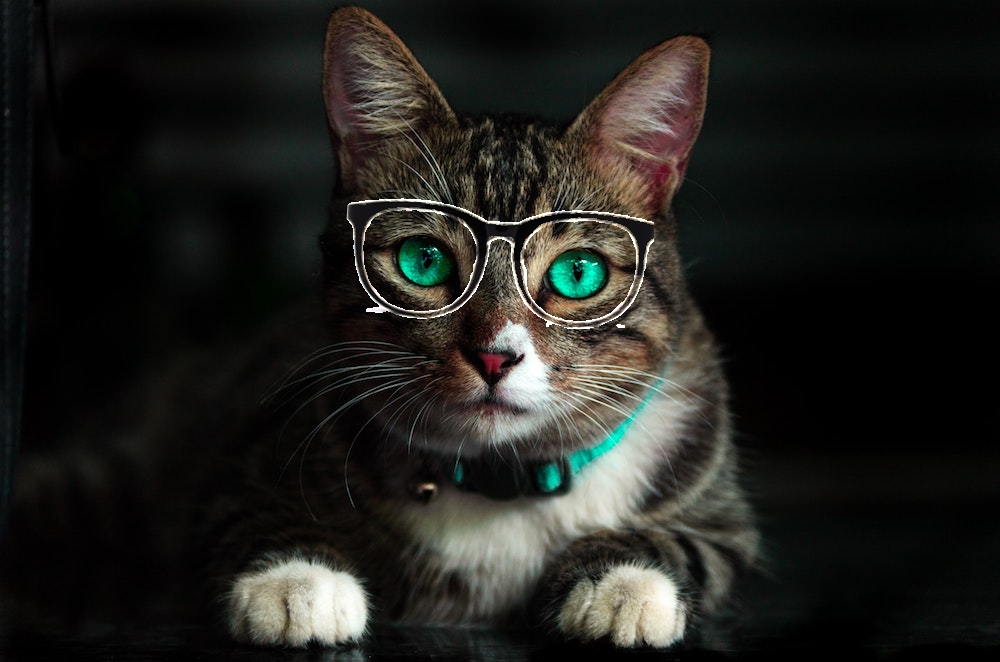

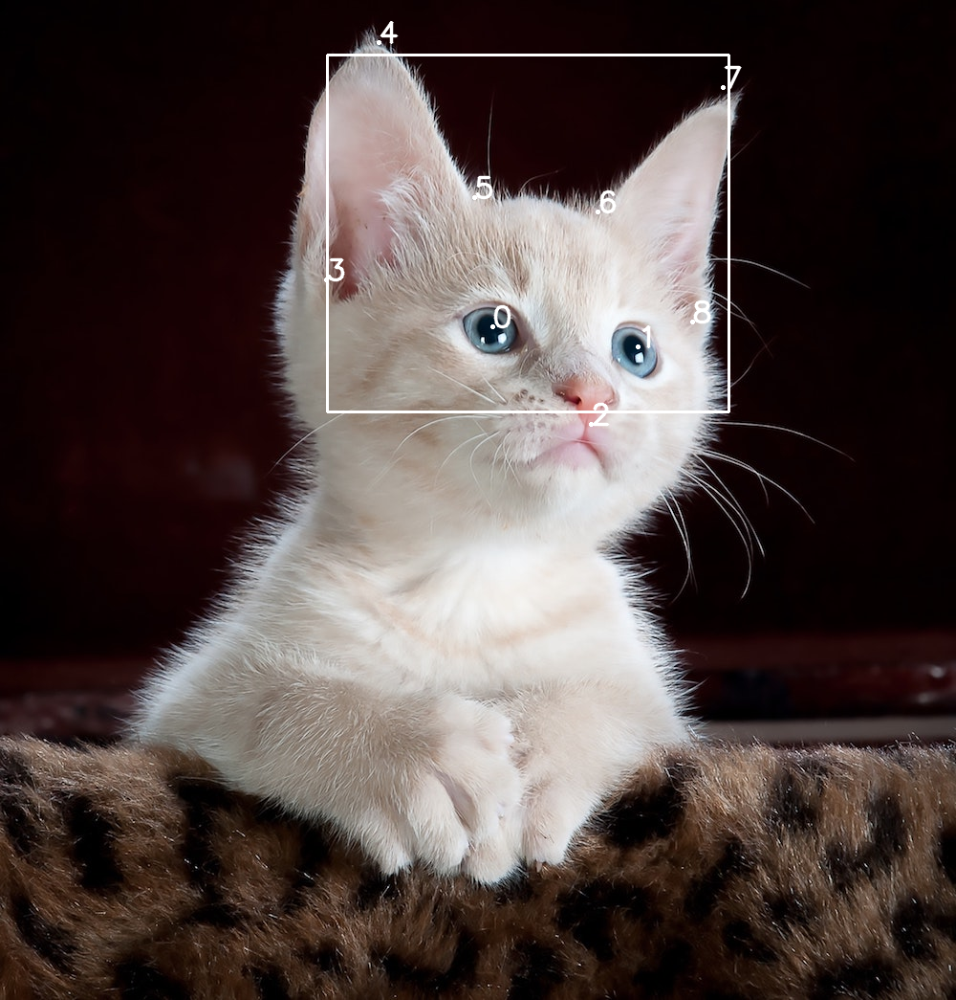

...

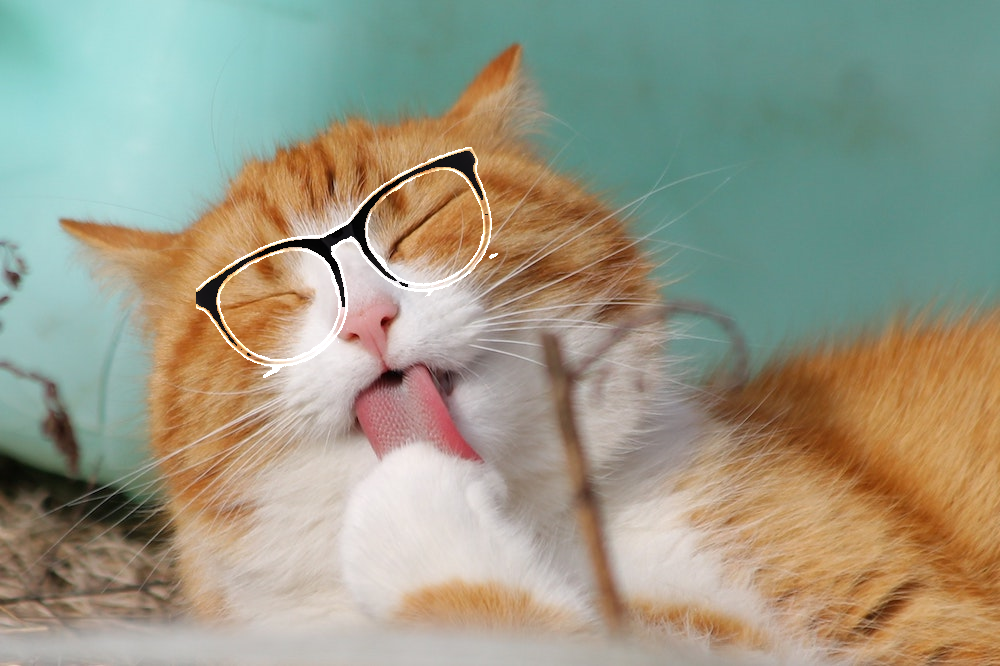

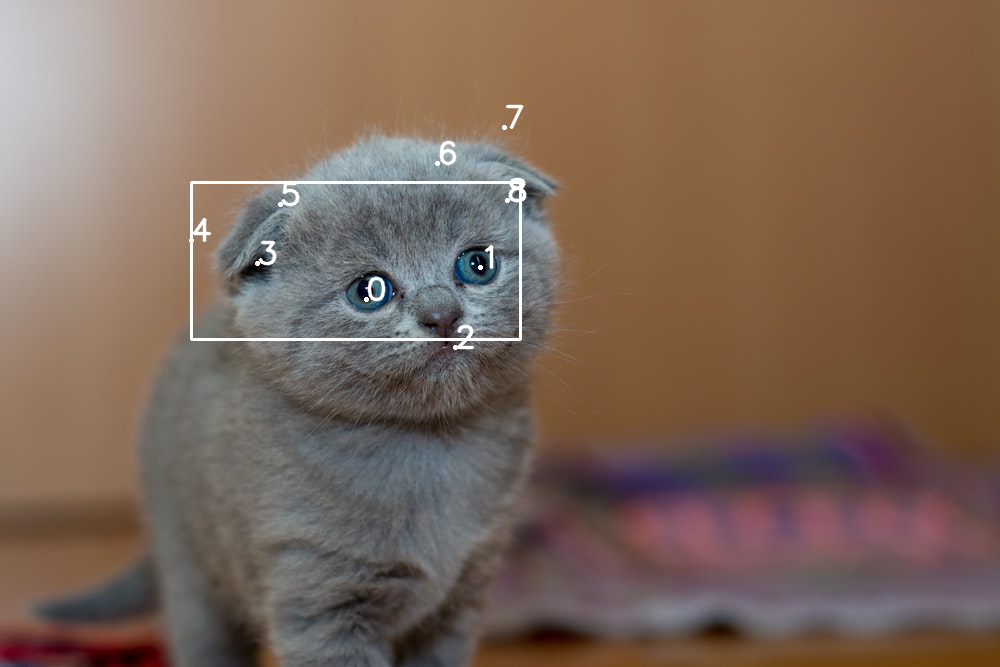

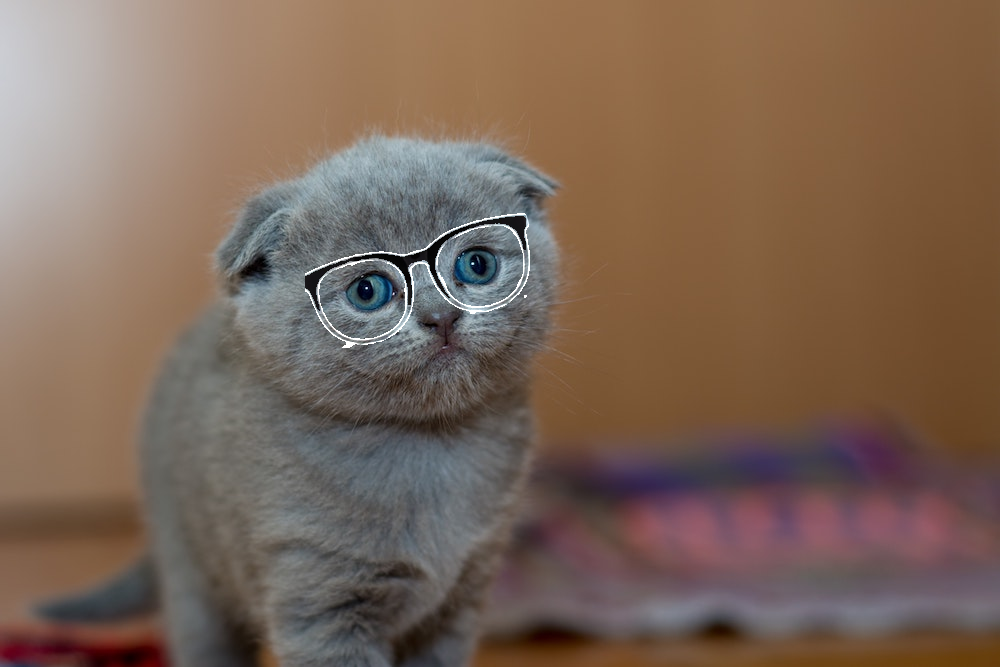

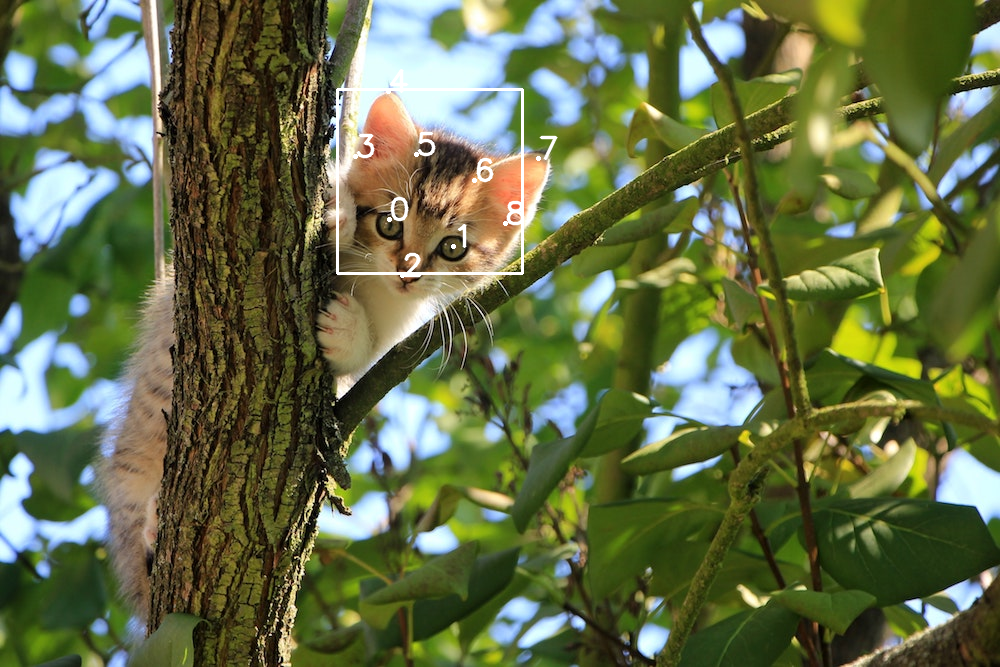

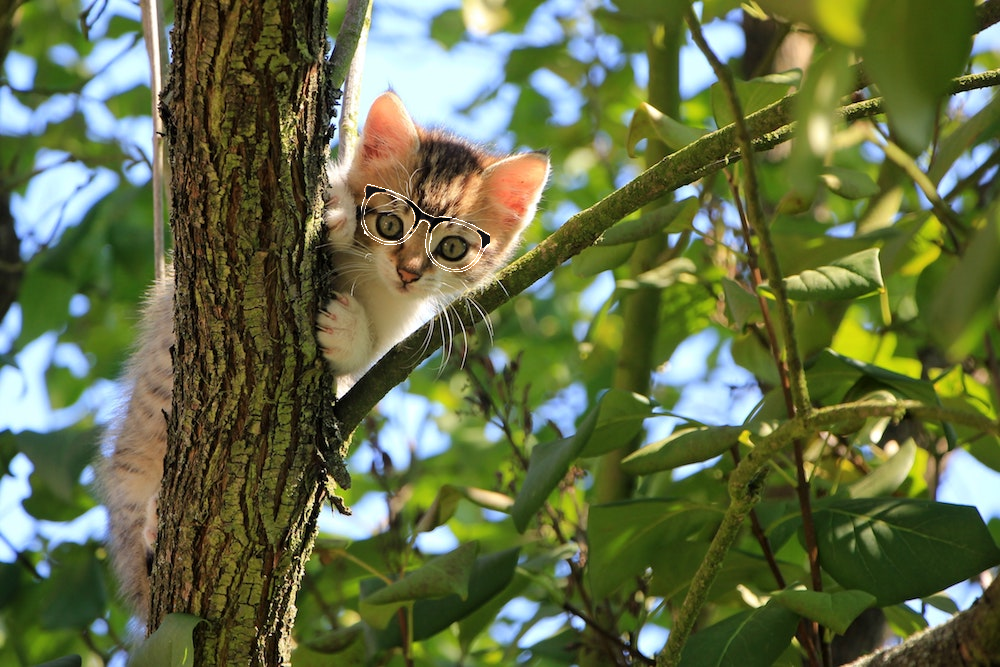

In [9]:
# testing
for f in file_list:
  if '.jpg' not in f:
    continue

  img = cv2.imread(os.path.join(base_path, f))
  ori_img = img.copy()
  result_img = img.copy()

  # predict bounding box
  img, ratio, top, left = resize_img(img)

  inputs = (img.astype('float32') / 255).reshape((1, img_size, img_size, 3))
  pred_bb = bbs_model.predict(inputs)[0].reshape((-1, 2))

  # compute bounding box of original image
  ori_bb = ((pred_bb - np.array([left, top])) / ratio).astype(np.int)

  # compute lazy bounding box for detecting landmarks
  center = np.mean(ori_bb, axis=0)
  face_size = max(np.abs(ori_bb[1] - ori_bb[0]))
  new_bb = np.array([
    center - face_size * 0.6,
    center + face_size * 0.6
  ]).astype(np.int)
  new_bb = np.clip(new_bb, 0, 99999)

  # predict landmarks
  face_img = ori_img[new_bb[0][1]:new_bb[1][1], new_bb[0][0]:new_bb[1][0]]
  face_img, face_ratio, face_top, face_left = resize_img(face_img)

  face_inputs = (face_img.astype('float32') / 255).reshape((1, img_size, img_size, 3))

  pred_lmks = lmks_model.predict(face_inputs)[0].reshape((-1, 2))

  # compute landmark of original image
  new_lmks = ((pred_lmks - np.array([face_left, face_top])) / face_ratio).astype(np.int)
  ori_lmks = new_lmks + new_bb[0]

  # visualize
  cv2.rectangle(ori_img, pt1=tuple(ori_bb[0]), pt2=tuple(ori_bb[1]), color=(255, 255, 255), thickness=2)

  for i, l in enumerate(ori_lmks):
    cv2.putText(ori_img, str(i), tuple(l), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.circle(ori_img, center=tuple(l), radius=1, color=(255, 255, 255), thickness=2)

  # wearing glasses
  glasses_center = np.mean([ori_lmks[0], ori_lmks[1]], axis=0)
  glasses_size = np.linalg.norm(ori_lmks[0] - ori_lmks[1]) * 2
  
  angle = -angle_between(ori_lmks[0], ori_lmks[1])
  M = cv2.getRotationMatrix2D((glasses.shape[1] / 2, glasses.shape[0] / 2), angle, 1)
  rotated_glasses = cv2.warpAffine(glasses, M, (glasses.shape[1],glasses.shape[0]))

  try:
    result_img = overlay_transparent(result_img, rotated_glasses, glasses_center[0], glasses_center[1], overlay_size=(int(glasses_size), int(glasses.shape[0] * glasses_size / glasses.shape[1])))
  except:
    print('failed overlay image')

  cv2_imshow(ori_img)
  cv2_imshow(result_img)
  filename, ext = os.path.splitext(f)